# Final Report

In [29]:
import numpy as np
import imageio
import csv
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
import pandas as pd

In [30]:
# functions took from https://github.com/maponti/imageprocessing_course_icmc
def histogram(A, no_levels):
    # gets the size of the input matrix
    N, M = A.shape
    hist = np.zeros(no_levels).astype(int)
    for i in range(no_levels):
        
        pixels_value_i = np.where(A == i)
        hist[i] = pixels_value_i[0].shape[0]
            
    return(hist)

def histogram_equalization(A, no_levels):
    hist = histogram(A,  no_levels)
    
    histC = np.zeros(no_levels).astype(int)

    histC[0] = hist[0] 
    for i in range(1,  no_levels):
        histC[i] = hist[i] + histC[i-1]

    hist_transform = np.zeros(no_levels).astype(np.uint8)
    N, M = A.shape
    A_eq = np.zeros([N,M]).astype(np.uint8)
    
    
    for r in range(no_levels):
        s = ((no_levels-1)/float(M*N))*histC[r]
        A_eq[ np.where(A == r) ] = s
    
    return A_eq

In [31]:
# nomalize numpy ndarray to [0,2^8-1]
def normalize(matrix):
    max = np.amax(matrix)
    min = np.amin(matrix)
    matrix = (matrix - min) / (max - min)
    matrix *= ((2**8)-1)

    return matrix

In [93]:
# function to enhance city areas based on a extended red index
def exr_city(img):
    
    r = img[:,:,0]
    g = img[:,:,1]
    b = img[:,:,2]
    
    #normalize channels
    r = r.astype(float)
    g = g.astype(float)
    b = b.astype(float)
    R = r/abs(r+g+b+10)
    G = g/abs(r+g+b+10)
    B = b/abs(r+g+b+10)
    
    # get extended red index image
    ExR = 3.5*R - 1.5*B - 2.5*G
    ExR = normalize(ExR).astype(np.uint8)
    exr_t = np.mean(ExR)

    # threshold for unintended area removal then equalize it
    tExR = np.where(ExR<1.05*exr_t, 0, ExR + 20)
    tExR = histogram_equalization(tExR,256)    
    tExR = normalize(tExR).astype(np.uint8)

    return tExR
    

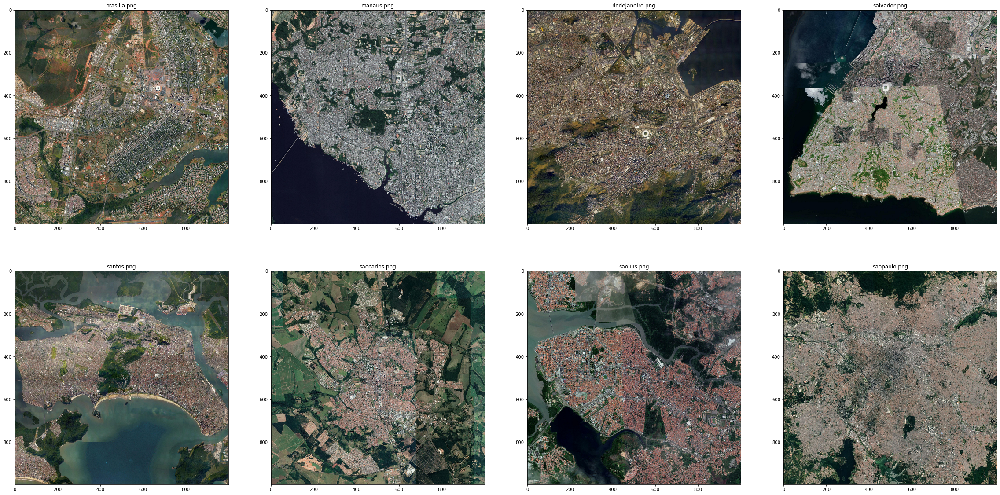

In [55]:
# reading images
df = pd.read_csv('cities.csv')
imgfiles = df.filename

folder = "PNGimages/"
img_list = []
plt.figure(figsize=(40,20))
for i in range(8):
    img_list.append(imageio.imread(folder+imgfiles[i]))
    plt.subplot(241+i); plt.imshow(img_list[i]); plt.title(imgfiles[i])

plt.show()    


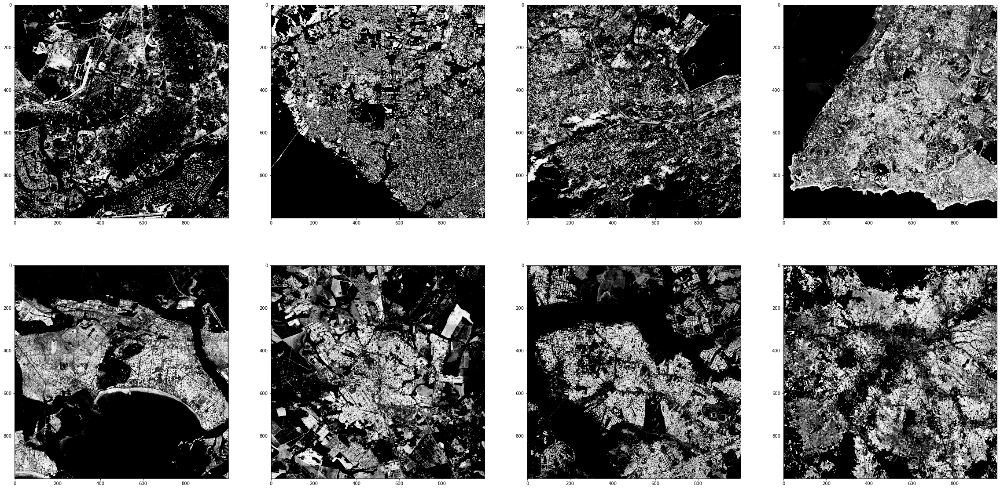

In [94]:
# apply exr_city() and plot 
exr_list = []
plt.figure(figsize=(40,20))
for i in range (8):
    exr_list.append(exr_city(img_list[i]))
    plt.subplot(241+i); plt.imshow(exr_list[i], cmap="gray")
    
plt.show()

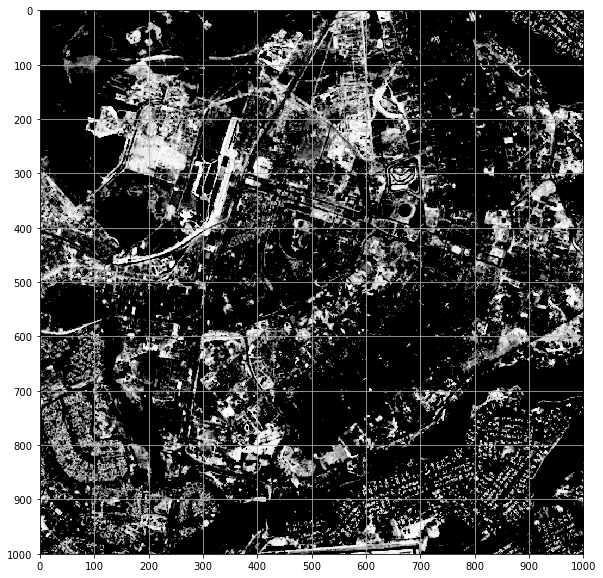

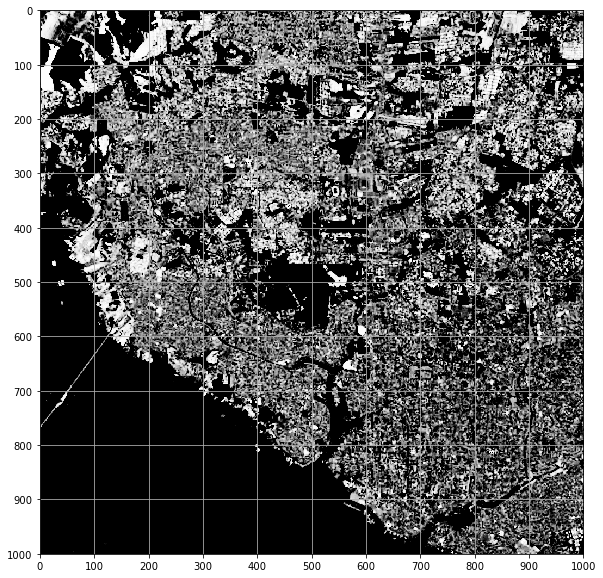

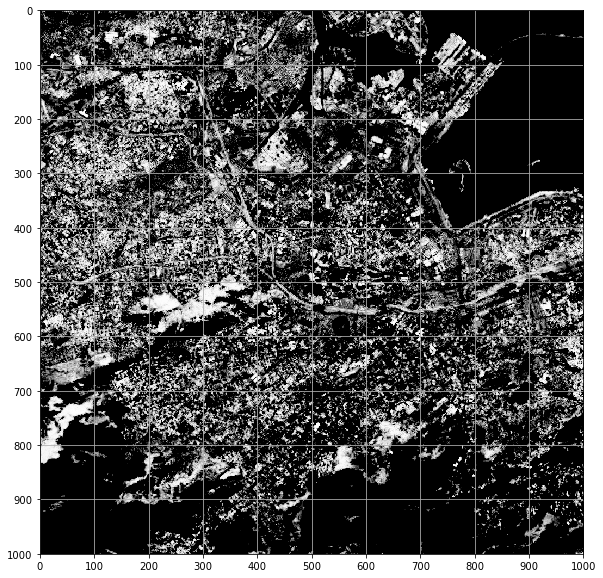

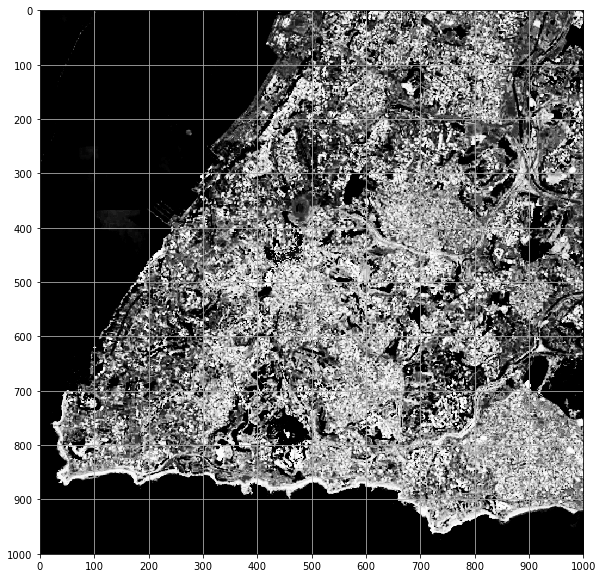

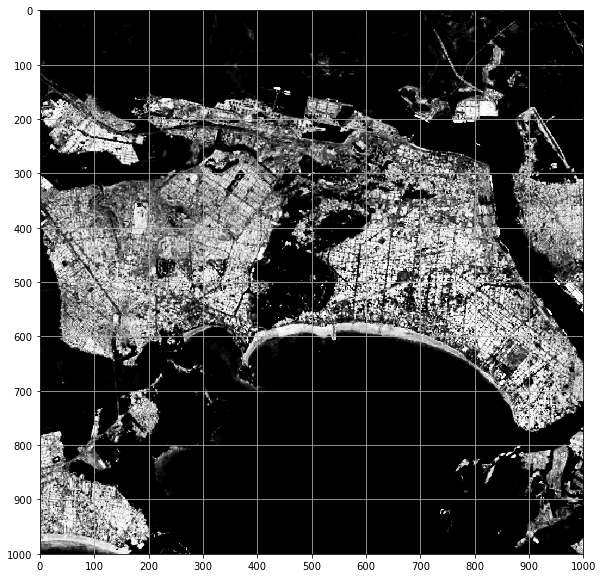

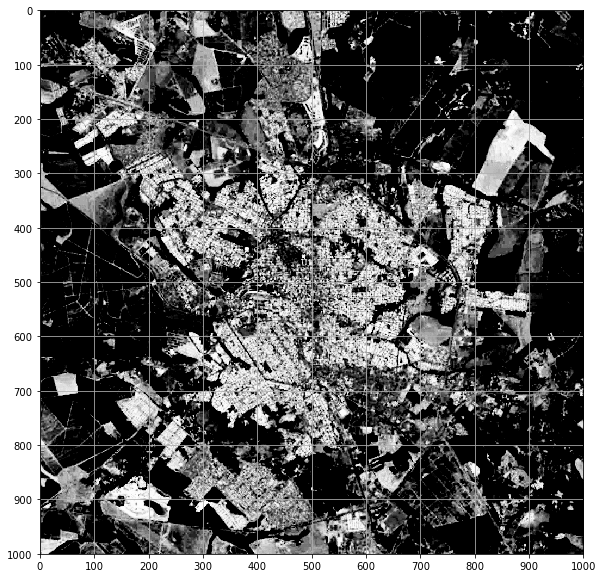

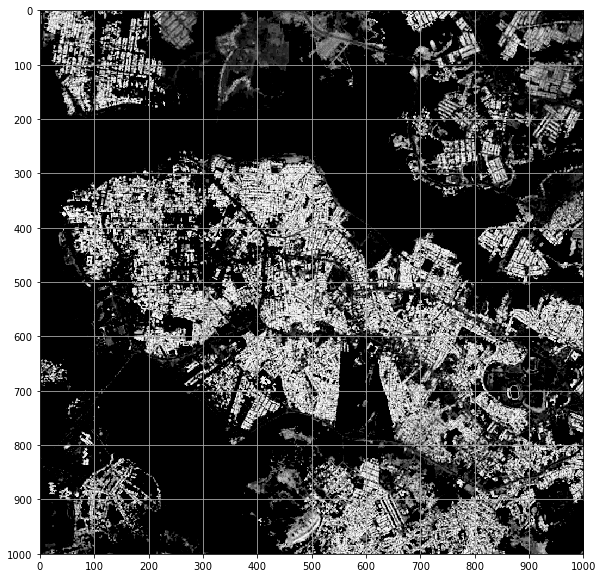

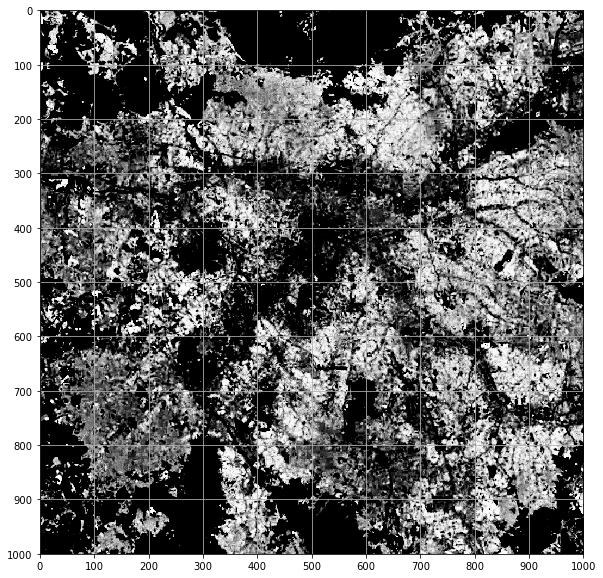

In [88]:
# grid and plot one by one
for i in range(8):
    plt.figure(figsize=(40,10))
    plt.imshow(exr_list[i],cmap='gray')
    plt.grid(True)
    plt.xticks(np.arange(0,1100, step=100))
    plt.yticks(np.arange(0,1100, step=100))

    plt.show()

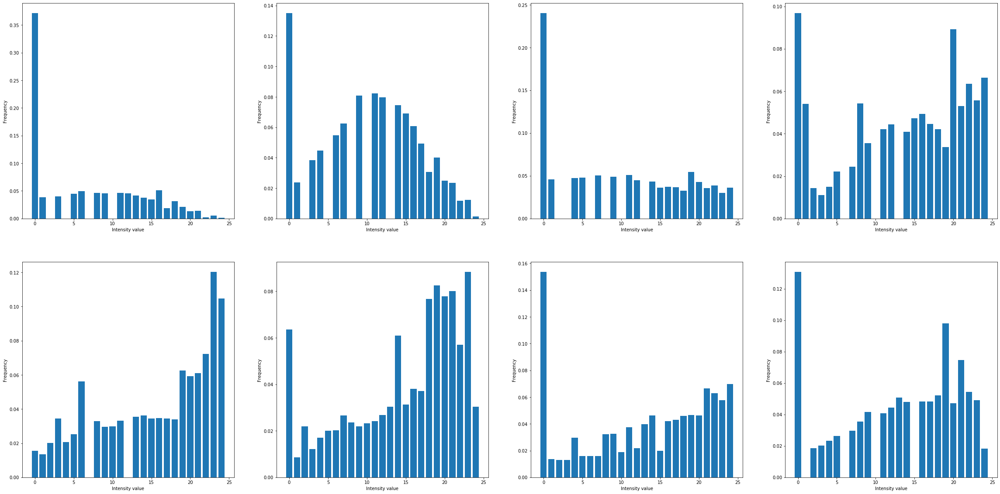

In [121]:
# chosen crowded squares
# brasilia: 800:901, 100:201
# manaus: 200:301, 200:301
# rio: 400:501, 300:401
# salvador:400:501, 400:501
# santos: 400:501, 600:701
# sao carlos: 600:701, 400:501
# sao luis: 600:701, 400:501
# sao paulo: 400:501: 700:801
cord =[ (800, 100),
        (200, 200),
        (400, 300),
        (400, 400),
        (400, 600),
        (600, 400),
        (600, 400),
        (400, 700)]
        
# get reference histograms
def hist_25intervals(A, no_levels):
    # gets the size of the input matrix
    #returns percentage of intensities in 25 evenly spaced intervals
    inter = no_levels/25.0
    A_alt = (A.flatten()/inter).astype(int)
    hist = np.zeros(25).astype(int)
    for i in range(25):
        
        pixels_value_i = np.where(A_alt==i)
        hist[i] = pixels_value_i[0].shape[0]
    hist = hist/np.sum(hist)
            
    return(hist)

def mean_hist25(exr_list,cord):
    
    hist_vet = np.zeros((100,100,25))
    ref_hist = np.zeros((8,25))
    for img in range(len(cord)):
        A = exr_list[img]
        ci,cj = cord[img]
        for i in range(100):
            for j in range(100):
                xi = ci+ i
                xj = cj+ j
                B = A[xi-2:xi+2, xj-2:xj+2]
                hist_vet[i,j] = hist_25intervals(B,256)
        for i in range(25):
            ref_hist[img,i] = np.mean(hist_vet[:,:,i])
    
    return ref_hist

ref_hist_vet = mean_hist25(exr_list, cord)
plt.figure(figsize=(40,20))
for i in range(8):
    plt.subplot(241+i); 
    plt.bar(range(25), ref_hist_vet[i]);
    plt.xlabel('Intensity value');
    plt.ylabel('Frequency');

plt.show()  

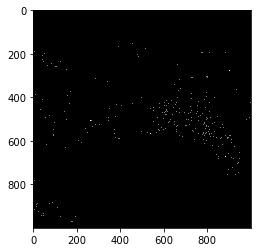

In [135]:
# function for histogram comparisson
#http://blog.datadive.net/histogram-intersection-for-change-detection/

def hist25_comp(ref,test):
    
    ratio = 0
    for i in range(25):
        ratio += min(ref[i],test[i])
    
    return ratio

# function to run over image, enhancing pixels by histogram comparisson
def hist_enhance(exr_img, ref_hist):
    
    pad_img = np.pad(exr_img,2,'constant')
    
    hist_heat = np.zeros(exr_img.shape)
    for i in range(exr_img.shape[0]):
        for j in range(exr_img.shape[1]):
            xi = i + 2
            xj = j + 2
            B = pad_img[xi-2:xi+2, xj-2:xj+2]
            hist = hist_25intervals(B,256)
            h_comp =hist25_comp(ref_hist, hist) 
            if(h_comp >= 0.9):
                hist_heat[i,j] = 4
            elif(h_comp>= 0.8):
                hist_heat[i,j] = 3
            elif(h_comp>= 0.7):
                hist_heat[i,j] = 2
            elif(h_comp>= 0.6):
                hist_heat[i,j] = 1
            else:
                hist_heat[i,j] = 0
    
    return hist_heat

heat = hist_enhance(exr_list[4],ref_hist_vet[4])
plt.imshow(heat,cmap="gray")

In [11]:
# process image with 5x5 windows
# plot results

In [ ]:
# tint greyscale image with resulting 